In [2]:
import PIL
import numpy as np
from PIL import Image, ImageDraw, ImageOps
import os, tqdm
import math
from sympy import *

In [3]:
anno_file = '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data/17TqLnza001_8_27/result.txt'#标注文件
save_dir = ''#保存图片路径

In [4]:
def get_file_list(anno_file): 
    with open(anno_file) as f:
        lines = f.readlines()
        res = []
        strs = str(1234657890)+','
        for line in lines:
            line = line.split('\t')
            for s in line[1]:
                if not s in strs:
                    line[1] = line[1].replace(s, '')
            line[1] = line[1].replace(',0000,','').split(',')
            line[1] = [int(x) for x in line[1] if x != '']
            for i in range(len(line[1])/2):
                line.append([line[1][2*i], line[1][2*i+1]])
            line.pop(1)
            if len(line) != 1 and len(line)%7 == 1:
                res.append(line)
        return res

In [5]:
file_list = get_file_list(anno_file)
print file_list[5]

['17TqLnza001_8_27/data/000006.jpeg', [196, 331], [350, 360], [272, 389], [229, 438], [287, 449], [193, 27], [391, 543], [613, 450], [761, 398], [692, 464], [679, 527], [746, 514], [457, 225], [884, 546]]


In [6]:
def distance(p1, p2):
    x1, y1 = p1
    x2, y2 = p2
    return np.sqrt((x1-x2)**2 + (y1-y2)**2)

In [7]:
def get_path(anno_file):
    file_list = get_file_list(anno_file)
    res = [x[0] for x in file_list]
    return res

In [8]:
path = get_path(anno_file)
print path[5]

17TqLnza001_8_27/data/000006.jpeg


In [9]:
def get_slope(p1, p2):
    p1=[float(x) for x in p1]
    p2=[float(x) for x in p2]
    return (p2[1]-p1[1])/(p2[0]-p1[0]+0.00001)

In [10]:
def find_square_point(p1,p2,slope):
    if slope == 0:
        slope = 0.0001
    x=Symbol('x')
    y=Symbol('y')
    point_rt, point_lb = [],[]
    res_rt = solve([(x-p1[0])*slope + p1[1] - y, (x-p2[0])*(-1/slope) + p2[1] - y],[x,y])
    res_lb = solve([(x-p2[0])*slope + p2[1] - y, (x-p1[0])*(-1/slope) + p1[1] - y],[x,y])
    for _,value in res_rt.items():
        point_rt.append(value)
    for _,value in res_lb.items():
        point_lb.append(value)
    return point_rt, point_lb

In [11]:
#x, y = find_square_point([0,1], [2,0], 0)
#print (x,y)

In [12]:
def get_square_point_list(file_list):
    point_list = []
    for x in file_list:
        point_list_tmp = []
        for index, i in enumerate(x):
            if index % 7 == 0 and index != 0:
                point_list_tmp.append([x[index-1], x[index]])
        point_list.append(point_list_tmp)
    return point_list

In [13]:
#point_list = get_square_point_list(file_list)
#print point_list[5]

In [14]:
def get_eyes_point_list(file_list):
    point_list = []
    for x in file_list:
        point_list_tmp = []
        for index, i in enumerate(x):
            if index % 7 == 1:
                point_list_tmp.append([x[index], x[index+1]])
        point_list.append(point_list_tmp)
    return point_list

In [15]:
def get_mouth_point_list(file_list):
    point_list = []
    for x in file_list:
        point_list_tmp = []
        for index, i in enumerate(x):
            if index % 7 == 3:
                point_list_tmp.append(x[index])
        point_list.append(point_list_tmp)
    return point_list

In [16]:
eyes_list = get_eyes_point_list(file_list)
mouth_list = get_mouth_point_list(file_list)
print eyes_list[5]
print mouth_list[5]

[[[196, 331], [350, 360]], [[613, 450], [761, 398]]]
[[272, 389], [692, 464]]


In [17]:
def check_lr(lt,rb,el,er):
    el = [float(x) for x in el]
    er = [float(x) for x in er]
    mid = [(el[0] + er[0])/2, (el[1] + er[1])/2]
    slope = (er[1] - el[1])/(er[0] - el[0]+0.0001)
    tmp_slope = slope
    if el[0] >er[0]:
        tmp_slope = (-slope)
    if slope == 0:
        slope = 0.00001
    if (-1)*slope*(lt[1] + (lt[0] - mid[0])/slope - mid[1])>0:
        return [lt, rb]
    else:
        print 'exchange', slope, lt[1], lt[0] ,mid[0], mid[1]
        return [rb, lt]

In [18]:
def add_pad(points, pad_size):
    for i in range(len(points)):
        points[i] += pad_size
    return points
    

In [19]:
def draw_img(anno_file, save_dir=None):
    if save_dir == None:
        save_dir=os.path.join(os.path.dirname(anno_file), 'draw')
    file_list = get_file_list(anno_file)
    print 'save_dir:', save_dir
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    path_list = get_path(anno_file)
    square_point_list = get_square_point_list(file_list)
    eyes_point_list = get_eyes_point_list(file_list)
    for  index, path, square_point, eyes_points, points in zip(range(len(path_list)),path_list, square_point_list, eyes_point_list, file_list):
        print path, str(index+1)+'/'+str(len(path_list))
        im = Image.open(os.path.join(os.path.dirname(os.path.dirname(anno_file)),path)).convert('RGB')
        draw = ImageDraw.Draw(im)
        for index, point in enumerate(points):
            if index != 0:
                if index%7 ==1 :
                    draw.ellipse([point[0]-5,point[1]-5,point[0]+5,point[1]+5], fill = 'yellow')
                elif index%7 ==2:
                    draw.ellipse([point[0]-5,point[1]-5,point[0]+5,point[1]+5], fill = 'red')
                else:
                     draw.ellipse([point[0]-5,point[1]-5,point[0]+5,point[1]+5], fill = 'blue')
        for i in range(len(square_point)):
            slope = get_slope(eyes_points[i][0], eyes_points[i][1])
            draw.line([eyes_points[i][0][0], eyes_points[i][0][1],eyes_points[i][1][0],eyes_points[i][1][1]], 'blue')
            point_rt, point_lb = find_square_point(square_point[i][0], square_point[i][1], slope)
            draw.polygon([square_point[i][0][0],square_point[i][0][1],point_rt[0],point_rt[1],square_point[i][1][0],square_point[i][1][1],
                          point_lb[0],point_lb[1]], outline = 'blue')
        im.save(os.path.join(save_dir, 'draw_' + os.path.basename(path)))
###展示图像标注点

In [332]:
draw_img(anno_file)

save_dir: /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data/17TqLnza001_8_27/draw
17TqLnza001_8_27/data/000001.jpeg 1/103
17TqLnza001_8_27/data/000002.jpeg 2/103
17TqLnza001_8_27/data/000003.jpeg 3/103
17TqLnza001_8_27/data/000004.jpeg 4/103
17TqLnza001_8_27/data/000005.jpeg 5/103
17TqLnza001_8_27/data/000006.jpeg 6/103
17TqLnza001_8_27/data/000007.jpeg 7/103
17TqLnza001_8_27/data/000008.jpeg 8/103
17TqLnza001_8_27/data/000009.jpeg 9/103
17TqLnza001_8_27/data/000010.jpeg 10/103
17TqLnza001_8_27/data/000011.jpeg 11/103
17TqLnza001_8_27/data/000012.jpeg 12/103
17TqLnza001_8_27/data/000013.jpeg 13/103
17TqLnza001_8_27/data/000014.png 14/103
17TqLnza001_8_27/data/000015.jpeg 15/103
17TqLnza001_8_27/data/000016.jpg 16/103
17TqLnza001_8_27/data/000017.png 17/103
17TqLnza001_8_27/data/000018.jpeg 18/103
17TqLnza001_8_27/data/000019.jpeg 19/103
17TqLnza001_8_27/data/000020.jpeg 20/103
17TqLnza001_8_27/data/000021.jpeg 21/103
17TqLnza001_8_27/data/000022.jpeg 22/103
17TqLnza001_8_27

In [20]:
annofile_list[3]
file_list = get_file_list(annofile_list[3])
#eyes_list = get_eyes_point_list(file_list)
for i in file_list:
    if len(i) != 8 and len(i) != 15 and len(i) != 22 and len(i) != 29:
        print i[0], len(i)

NameError: name 'annofile_list' is not defined

In [ ]:
def crop_img(anno_file, save_dir=None):
    if save_dir == None:
        save_dir=os.path.join(os.path.dirname(anno_file), 'crop')
    file_list = get_file_list(anno_file)[678:]
    print 'save_dir:', save_dir
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    path_list = get_path(anno_file)[678:]
    square_point_list = get_square_point_list(file_list)
    eyes_point_list = get_eyes_point_list(file_list)
    for index, path, square_point, eyes_points in zip(range(len(path_list)), path_list, square_point_list, eyes_point_list):
        print path, str(index+1)+'/'+str(len(path_list))
        im = Image.open(os.path.join(os.path.dirname(os.path.dirname(anno_file)),path)).convert('RGB')
        draw = ImageDraw.Draw(im)
        for i in range(len(square_point)):
            square_point[i] = check_lr(square_point[i][0], square_point[i][1],
                                      eyes_points[i][0], eyes_points[i][1])
            slope = get_slope(eyes_points[i][0], eyes_points[i][1])
            point_rt, point_lb = find_square_point(square_point[i][0], square_point[i][1], slope)
            arc = math.degrees(np.arctan(slope))
            dis = distance(square_point[i][0],square_point[i][1])
            #tmp_im = im.resize((im.size[0]*2, im.size[1]*2), Image.LANCZOS)
            #tmp_im = im.rotate(arc, center = (square_point[i][0][0], square_point[i][0][1]), resample=Image.BICUBIC)
            #tmp_im = tmp_im.resize((tmp_im.size[0]/2, tmp_im.size[1]/2), Image.LANCZOS)
            x1, y1 = [square_point[i][0][0], square_point[i][0][1]]
            x3, y3 = [square_point[i][0][0]+distance(square_point[i][0], [float(x) for x in point_rt]),
                       square_point[i][0][1]+distance(square_point[i][0], [float(x) for x in point_lb])]
            x2, y2 = [x1, y3]
            x4, y4 = [x3, y1]
            face_width = distance((x1,y1),(x4,y4))
            face_height = distance((x2,y2),(x1,y1))
            w = face_width
            h = face_height
            pad_type = 'edge'
            pad_size = int(max(im.size[0], im.size[1]) / 2)
            np_im = np.array(im)
            tmp_im = Image.fromarray(np.rot90(np.array([np.pad(np_im[:,:,0], pad_size, pad_type), \
                                              np.pad(np_im[:,:,1], pad_size, pad_type), \
                                              np.pad(np_im[:,:,2], pad_size, pad_type)]).T, 3))
            tmp_im = ImageOps.mirror(tmp_im)
            x1, y1, x2, y2, x3, y3, x4, y4=add_pad([x1, y1, x2, y2, x3, y3, x4, y4], pad_size)
            tmp_im = tmp_im.rotate(arc, center = [x1,y1], resample=Image.BICUBIC)
            x1 -= w * 3/4
            x3 += w * 3/4
            y1 -= w * 1/3
            y3 += w * 1/3
            #tmp_im = tmp_im.crop([square_point[i][0][0], square_point[i][0][1],
            #           square_point[i][0][0]+distance(square_point[i][0], [float(x) for x in point_rt]),
            #           square_point[i][0][1]+distance(square_point[i][0], [float(x) for x in point_lb])])
            tmp_im = tmp_im.crop((x1,y1,x3,y3))
            tmp_im.save(os.path.join(save_dir, 'crop_' +str(i)+ '_'+ os.path.basename(path)))
###旋转切割图像

In [519]:
crop_img(annofile_list[3])

save_dir: /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_10_08/crop
El9cqx0m001_10_08/data/003099.jpg 1/1923
El9cqx0m001_10_08/data/000200.jpg 2/1923
El9cqx0m001_10_08/data/000508.jpg 3/1923
El9cqx0m001_10_08/data/002075.jpg 4/1923
El9cqx0m001_10_08/data/002446.jpg 5/1923
El9cqx0m001_10_08/data/003121.jpg 6/1923
El9cqx0m001_10_08/data/002204.jpg 7/1923
El9cqx0m001_10_08/data/002795.jpg 8/1923
El9cqx0m001_10_08/data/000530.jpg 9/1923
El9cqx0m001_10_08/data/000541.jpg 10/1923
El9cqx0m001_10_08/data/001263.jpg 11/1923
El9cqx0m001_10_08/data/001521.jpg 12/1923
El9cqx0m001_10_08/data/001678.jpg 13/1923
El9cqx0m001_10_08/data/002016.jpg 14/1923
El9cqx0m001_10_08/data/002863.jpg 15/1923
El9cqx0m001_10_08/data/002881.jpg 16/1923
exchange 6.90479478474 544 60 430.5 371.5
El9cqx0m001_10_08/data/000131.jpg 17/1923
El9cqx0m001_10_08/data/001486.jpg 18/1923
El9cqx0m001_10_08/data/002132.jpg 19/1923
El9cqx0m001_10_08/data/002279.jpg 20/1923
El9cqx0m001_10_08/data/002652.j

El9cqx0m001_10_08/data/002313.jpg 184/1923
El9cqx0m001_10_08/data/000469.jpg 185/1923
El9cqx0m001_10_08/data/001338.jpg 186/1923
El9cqx0m001_10_08/data/001608.jpg 187/1923
El9cqx0m001_10_08/data/001749.jpg 188/1923
El9cqx0m001_10_08/data/001868.jpg 189/1923
El9cqx0m001_10_08/data/002772.jpg 190/1923
El9cqx0m001_10_08/data/000036.jpg 191/1923
El9cqx0m001_10_08/data/000387.jpg 192/1923
El9cqx0m001_10_08/data/000430.jpg 193/1923
El9cqx0m001_10_08/data/000962.jpg 194/1923
El9cqx0m001_10_08/data/001581.jpg 195/1923
El9cqx0m001_10_08/data/001900.jpg 196/1923
El9cqx0m001_10_08/data/002822.jpg 197/1923
El9cqx0m001_10_08/data/000347.jpg 198/1923
El9cqx0m001_10_08/data/001398.jpg 199/1923
El9cqx0m001_10_08/data/001411.jpg 200/1923
El9cqx0m001_10_08/data/002105.jpg 201/1923
El9cqx0m001_10_08/data/002129.jpg 202/1923
El9cqx0m001_10_08/data/002538.jpg 203/1923
El9cqx0m001_10_08/data/000113.jpg 204/1923
El9cqx0m001_10_08/data/000712.jpg 205/1923
El9cqx0m001_10_08/data/001456.jpg 206/1923
El9cqx0m001

El9cqx0m001_10_08/data/001163.jpg 369/1923
El9cqx0m001_10_08/data/001369.jpg 370/1923
El9cqx0m001_10_08/data/002322.jpg 371/1923
El9cqx0m001_10_08/data/002367.jpg 372/1923
exchange -2.3243306063 779 1565 1373.5 784.0
El9cqx0m001_10_08/data/000240.jpg 373/1923
El9cqx0m001_10_08/data/000318.jpg 374/1923
El9cqx0m001_10_08/data/002485.jpg 375/1923
El9cqx0m001_10_08/data/002162.jpg 376/1923
El9cqx0m001_10_08/data/002317.jpg 377/1923
El9cqx0m001_10_08/data/000012.jpg 378/1923
El9cqx0m001_10_08/data/000070.jpg 379/1923
El9cqx0m001_10_08/data/000660.jpg 380/1923
El9cqx0m001_10_08/data/001255.jpg 381/1923
El9cqx0m001_10_08/data/001462.jpg 382/1923
El9cqx0m001_10_08/data/001984.jpg 383/1923
El9cqx0m001_10_08/data/002854.jpg 384/1923
El9cqx0m001_10_08/data/000037.jpg 385/1923
El9cqx0m001_10_08/data/000865.jpg 386/1923
El9cqx0m001_10_08/data/002343.jpg 387/1923
El9cqx0m001_10_08/data/003062.jpg 388/1923
El9cqx0m001_10_08/data/001105.jpg 389/1923
El9cqx0m001_10_08/data/001203.jpg 390/1923
El9cqx0m0

El9cqx0m001_10_08/data/000520.jpg 550/1923
El9cqx0m001_10_08/data/001037.jpg 551/1923
El9cqx0m001_10_08/data/001731.jpg 552/1923
El9cqx0m001_10_08/data/002597.jpg 553/1923
El9cqx0m001_10_08/data/002316.jpg 554/1923
El9cqx0m001_10_08/data/000008.jpg 555/1923
El9cqx0m001_10_08/data/000536.jpg 556/1923
El9cqx0m001_10_08/data/000875.jpg 557/1923
El9cqx0m001_10_08/data/001885.jpg 558/1923
El9cqx0m001_10_08/data/001969.jpg 559/1923
El9cqx0m001_10_08/data/002272.jpg 560/1923
El9cqx0m001_10_08/data/000364.jpg 561/1923
El9cqx0m001_10_08/data/001132.jpg 562/1923
El9cqx0m001_10_08/data/001134.jpg 563/1923
El9cqx0m001_10_08/data/001349.jpg 564/1923
El9cqx0m001_10_08/data/002844.jpg 565/1923
El9cqx0m001_10_08/data/002890.jpg 566/1923
El9cqx0m001_10_08/data/000085.jpg 567/1923
El9cqx0m001_10_08/data/001553.jpg 568/1923
El9cqx0m001_10_08/data/001647.jpg 569/1923
El9cqx0m001_10_08/data/001869.jpg 570/1923
El9cqx0m001_10_08/data/002037.jpg 571/1923
El9cqx0m001_10_08/data/002039.jpg 572/1923
El9cqx0m001

El9cqx0m001_10_08/data/000891.jpg 732/1923
El9cqx0m001_10_08/data/001551.jpg 733/1923
El9cqx0m001_10_08/data/001634.jpg 734/1923
El9cqx0m001_10_08/data/001824.jpg 735/1923
El9cqx0m001_10_08/data/001864.jpg 736/1923
El9cqx0m001_10_08/data/001968.jpg 737/1923
El9cqx0m001_10_08/data/000031.jpg 738/1923
El9cqx0m001_10_08/data/001056.jpg 739/1923
El9cqx0m001_10_08/data/001292.jpg 740/1923
El9cqx0m001_10_08/data/001304.jpg 741/1923
El9cqx0m001_10_08/data/001316.jpg 742/1923
El9cqx0m001_10_08/data/001650.jpg 743/1923
El9cqx0m001_10_08/data/001982.jpg 744/1923
El9cqx0m001_10_08/data/002237.jpg 745/1923
El9cqx0m001_10_08/data/002570.jpg 746/1923
exchange -0.72463873136 633 995 852.5 545.0
El9cqx0m001_10_08/data/001019.jpg 747/1923
El9cqx0m001_10_08/data/001284.jpg 748/1923
El9cqx0m001_10_08/data/001328.jpg 749/1923
El9cqx0m001_10_08/data/001878.jpg 750/1923
El9cqx0m001_10_08/data/001937.jpg 751/1923
El9cqx0m001_10_08/data/002969.jpg 752/1923
El9cqx0m001_10_08/data/002996.jpg 753/1923
El9cqx0m00

El9cqx0m001_10_08/data/001686.jpg 918/1923
El9cqx0m001_10_08/data/001833.jpg 919/1923
El9cqx0m001_10_08/data/001892.jpg 920/1923
El9cqx0m001_10_08/data/003023.jpg 921/1923
El9cqx0m001_10_08/data/000630.jpg 922/1923
El9cqx0m001_10_08/data/000661.jpg 923/1923
El9cqx0m001_10_08/data/000947.jpg 924/1923
El9cqx0m001_10_08/data/001011.jpg 925/1923
El9cqx0m001_10_08/data/001697.jpg 926/1923
El9cqx0m001_10_08/data/002045.jpg 927/1923
El9cqx0m001_10_08/data/000063.jpg 928/1923
El9cqx0m001_10_08/data/001560.jpg 929/1923
El9cqx0m001_10_08/data/001694.jpg 930/1923
El9cqx0m001_10_08/data/002946.jpg 931/1923
El9cqx0m001_10_08/data/002948.jpg 932/1923
El9cqx0m001_10_08/data/002953.jpg 933/1923
exchange -0.647059775088 848 1510 1314.0 672.0
El9cqx0m001_10_08/data/000295.jpg 934/1923
exchange 4.62964677647 943 401 625.5 769.5
El9cqx0m001_10_08/data/000808.jpg 935/1923
El9cqx0m001_10_08/data/001227.jpg 936/1923
El9cqx0m001_10_08/data/001480.jpg 937/1923
El9cqx0m001_10_08/data/001691.jpg 938/1923
El9cqx0

El9cqx0m001_10_08/data/003066.jpg 1104/1923
El9cqx0m001_10_08/data/002390.jpg 1105/1923
El9cqx0m001_10_08/data/002457.jpg 1106/1923
El9cqx0m001_10_08/data/000278.jpg 1107/1923
El9cqx0m001_10_08/data/000414.jpg 1108/1923
El9cqx0m001_10_08/data/000514.jpg 1109/1923
El9cqx0m001_10_08/data/001461.jpg 1110/1923
El9cqx0m001_10_08/data/001499.jpg 1111/1923
El9cqx0m001_10_08/data/001939.jpg 1112/1923
El9cqx0m001_10_08/data/002530.jpg 1113/1923
El9cqx0m001_10_08/data/000147.jpg 1114/1923
El9cqx0m001_10_08/data/000370.jpg 1115/1923
El9cqx0m001_10_08/data/002017.jpg 1116/1923
El9cqx0m001_10_08/data/002464.jpg 1117/1923
El9cqx0m001_10_08/data/002677.jpg 1118/1923
El9cqx0m001_10_08/data/000333.jpg 1119/1923
El9cqx0m001_10_08/data/000709.jpg 1120/1923
El9cqx0m001_10_08/data/001370.jpg 1121/1923
El9cqx0m001_10_08/data/001383.jpg 1122/1923
El9cqx0m001_10_08/data/002711.jpg 1123/1923
El9cqx0m001_10_08/data/001830.jpg 1124/1923
El9cqx0m001_10_08/data/000242.jpg 1125/1923
El9cqx0m001_10_08/data/000268.jp

El9cqx0m001_10_08/data/000366.jpg 1283/1923
El9cqx0m001_10_08/data/000571.jpg 1284/1923
El9cqx0m001_10_08/data/000653.jpg 1285/1923
El9cqx0m001_10_08/data/001104.jpg 1286/1923
El9cqx0m001_10_08/data/001622.jpg 1287/1923
El9cqx0m001_10_08/data/001695.jpg 1288/1923
El9cqx0m001_10_08/data/002448.jpg 1289/1923
El9cqx0m001_10_08/data/002469.jpg 1290/1923
El9cqx0m001_10_08/data/000523.jpg 1291/1923
El9cqx0m001_10_08/data/000815.jpg 1292/1923
El9cqx0m001_10_08/data/001228.jpg 1293/1923
El9cqx0m001_10_08/data/001367.jpg 1294/1923
El9cqx0m001_10_08/data/002138.jpg 1295/1923
El9cqx0m001_10_08/data/002223.jpg 1296/1923
El9cqx0m001_10_08/data/002759.jpg 1297/1923
El9cqx0m001_10_08/data/000058.jpg 1298/1923
El9cqx0m001_10_08/data/000537.jpg 1299/1923
El9cqx0m001_10_08/data/001943.jpg 1300/1923
El9cqx0m001_10_08/data/002751.jpg 1301/1923
El9cqx0m001_10_08/data/001159.jpg 1302/1923
El9cqx0m001_10_08/data/001300.jpg 1303/1923
El9cqx0m001_10_08/data/001642.jpg 1304/1923
El9cqx0m001_10_08/data/002260.jp

El9cqx0m001_10_08/data/000286.jpg 1466/1923
El9cqx0m001_10_08/data/000647.jpg 1467/1923
El9cqx0m001_10_08/data/001535.jpg 1468/1923
El9cqx0m001_10_08/data/001613.jpg 1469/1923
El9cqx0m001_10_08/data/001770.jpg 1470/1923
El9cqx0m001_10_08/data/002073.jpg 1471/1923
El9cqx0m001_10_08/data/002895.jpg 1472/1923
El9cqx0m001_10_08/data/002974.jpg 1473/1923
El9cqx0m001_10_08/data/000495.jpg 1474/1923
El9cqx0m001_10_08/data/000603.jpg 1475/1923
El9cqx0m001_10_08/data/000609.jpg 1476/1923
El9cqx0m001_10_08/data/000679.jpg 1477/1923
El9cqx0m001_10_08/data/002865.jpg 1478/1923
El9cqx0m001_10_08/data/003095.jpg 1479/1923
El9cqx0m001_10_08/data/003043.jpg 1480/1923
El9cqx0m001_10_08/data/000306.jpg 1481/1923
El9cqx0m001_10_08/data/000493.jpg 1482/1923
El9cqx0m001_10_08/data/001138.jpg 1483/1923
El9cqx0m001_10_08/data/002294.jpg 1484/1923
El9cqx0m001_10_08/data/002706.jpg 1485/1923
El9cqx0m001_10_08/data/001502.jpg 1486/1923
El9cqx0m001_10_08/data/001508.jpg 1487/1923
El9cqx0m001_10_08/data/000597.jp

El9cqx0m001_10_08/data/001607.jpg 1645/1923
El9cqx0m001_10_08/data/001920.jpg 1646/1923
exchange -1.40000280001 510 1414 1252.0 493.0
El9cqx0m001_10_08/data/001972.jpg 1647/1923
El9cqx0m001_10_08/data/002178.jpg 1648/1923
El9cqx0m001_10_08/data/002727.jpg 1649/1923
El9cqx0m001_10_08/data/000185.jpg 1650/1923
El9cqx0m001_10_08/data/000394.jpg 1651/1923
El9cqx0m001_10_08/data/000515.jpg 1652/1923
El9cqx0m001_10_08/data/000666.jpg 1653/1923
El9cqx0m001_10_08/data/001474.jpg 1654/1923
El9cqx0m001_10_08/data/001669.jpg 1655/1923
El9cqx0m001_10_08/data/000427.jpg 1656/1923
El9cqx0m001_10_08/data/000849.jpg 1657/1923
El9cqx0m001_10_08/data/002907.jpg 1658/1923
exchange 11.0000687504 560 4 360.0 375.0
El9cqx0m001_10_08/data/002918.jpg 1659/1923
El9cqx0m001_10_08/data/003051.jpg 1660/1923
El9cqx0m001_10_08/data/000350.jpg 1661/1923
El9cqx0m001_10_08/data/000547.jpg 1662/1923
El9cqx0m001_10_08/data/002325.jpg 1663/1923
El9cqx0m001_10_08/data/002638.jpg 1664/1923
El9cqx0m001_10_08/data/003026.jpg

El9cqx0m001_10_08/data/000998.jpg 1828/1923
El9cqx0m001_10_08/data/002023.jpg 1829/1923
El9cqx0m001_10_08/data/002179.jpg 1830/1923
El9cqx0m001_10_08/data/002268.jpg 1831/1923
El9cqx0m001_10_08/data/002888.jpg 1832/1923
exchange -0.343558492981 1077 1423 1137.5 764.0
El9cqx0m001_10_08/data/003016.jpg 1833/1923
El9cqx0m001_10_08/data/000524.jpg 1834/1923
El9cqx0m001_10_08/data/000882.jpg 1835/1923
El9cqx0m001_10_08/data/001699.jpg 1836/1923
El9cqx0m001_10_08/data/001990.jpg 1837/1923
exchange 5.17393553885 521 55 255.5 364.5
El9cqx0m001_10_08/data/000040.jpg 1838/1923
El9cqx0m001_10_08/data/000175.jpg 1839/1923
El9cqx0m001_10_08/data/001907.jpg 1840/1923
El9cqx0m001_10_08/data/002667.jpg 1841/1923
El9cqx0m001_10_08/data/002746.jpg 1842/1923
El9cqx0m001_10_08/data/000179.jpg 1843/1923
El9cqx0m001_10_08/data/000194.jpg 1844/1923
El9cqx0m001_10_08/data/000727.jpg 1845/1923
El9cqx0m001_10_08/data/001275.jpg 1846/1923
El9cqx0m001_10_08/data/001643.jpg 1847/1923
El9cqx0m001_10_08/data/001720.

In [514]:
annofile_list[3]

'/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_10_08/El9cqx0m001_10_08.result'

In [22]:
dir = '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2' 

In [23]:
def get_annofile_list(key):
    L =[]
    for root, dirs, files in os.walk(dir):
        for file in files:
            if os.path.splitext(file)[1] == key: 
                L.append(os.path.join(root, file))
    return L

In [24]:
annofile_list = get_annofile_list('.result')
annofile_list

['/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/17TqLnza001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/6K1ojs9N001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/El9cqx0m001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/nTeEcRpg001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/VCaPNyMn001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/JyQ0iCaC001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/Hcz4gGxW001_9_30.result']

In [ ]:
for i in tqdm.tqdm_notebook(annofile_list):
    print i
    #draw_img(i)
    crop_img(i)
    #find_Inverted(i)

/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/17TqLnza001_9_30.result
save_dir: /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop
17TqLnza001_9_30/data/010658.jpg 1/11136
17TqLnza001_9_30/data/000154.jpg 2/11136
17TqLnza001_9_30/data/004783.jpg 3/11136

17TqLnza001_9_30/data/009998.jpg 4/11136
17TqLnza001_9_30/data/008002.jpg 5/11136
17TqLnza001_9_30/data/002961.jpg 6/11136
17TqLnza001_9_30/data/004083.jpg 7/11136
17TqLnza001_9_30/data/005447.jpg 8/11136
17TqLnza001_9_30/data/008149.jpg 9/11136
17TqLnza001_9_30/data/009972.jpg 10/11136
17TqLnza001_9_30/data/006680.jpg 11/11136
17TqLnza001_9_30/data/007299.jpg 12/11136
17TqLnza001_9_30/data/007830.jpg 13/11136
17TqLnza001_9_30/data/008346.jpg 14/11136
exchange -0.64238453138 896 1713 1399.5 678.5
17TqLnza001_9_30/data/008497.jpg 15/11136
17TqLnza001_9_30/data/002519.jpg 16/11136
17TqLnza001_9_30/data/004261.jpg 17/11136
17TqLnza001_9_30/data/004690.jpg 18/11136
17TqLnz

17TqLnza001_9_30/data/008456.jpg 188/11136
17TqLnza001_9_30/data/000928.jpg 189/11136
17TqLnza001_9_30/data/001102.jpg 190/11136
17TqLnza001_9_30/data/001656.jpg 191/11136
17TqLnza001_9_30/data/008707.jpg 192/11136
17TqLnza001_9_30/data/010431.jpg 193/11136
17TqLnza001_9_30/data/008115.jpg 194/11136
17TqLnza001_9_30/data/009225.jpg 195/11136
17TqLnza001_9_30/data/004246.jpg 196/11136
17TqLnza001_9_30/data/004413.jpg 197/11136
17TqLnza001_9_30/data/004577.jpg 198/11136
17TqLnza001_9_30/data/005233.jpg 199/11136
17TqLnza001_9_30/data/005926.jpg 200/11136
17TqLnza001_9_30/data/001557.jpg 201/11136
17TqLnza001_9_30/data/003909.jpg 202/11136
17TqLnza001_9_30/data/004643.jpg 203/11136
17TqLnza001_9_30/data/005827.jpg 204/11136
17TqLnza001_9_30/data/005981.jpg 205/11136
17TqLnza001_9_30/data/000391.jpg 206/11136
17TqLnza001_9_30/data/001459.jpg 207/11136
17TqLnza001_9_30/data/004239.jpg 208/11136
17TqLnza001_9_30/data/002950.jpg 209/11136
17TqLnza001_9_30/data/003248.jpg 210/11136
17TqLnza001

17TqLnza001_9_30/data/006761.jpg 372/11136
17TqLnza001_9_30/data/006624.jpg 373/11136
17TqLnza001_9_30/data/010134.jpg 374/11136
17TqLnza001_9_30/data/010835.jpg 375/11136
17TqLnza001_9_30/data/000726.jpg 376/11136
17TqLnza001_9_30/data/001268.jpg 377/11136
17TqLnza001_9_30/data/005622.jpg 378/11136
17TqLnza001_9_30/data/002148.jpg 379/11136
exchange -0.499999528302 355 1111 983.0 290.5
17TqLnza001_9_30/data/002232.jpg 380/11136
exchange 2.35484630596 548 103 197.5 433.5
17TqLnza001_9_30/data/002421.jpg 381/11136
exchange 24.7144622462 948 83 622.0 673.0
17TqLnza001_9_30/data/005323.jpg 382/11136
17TqLnza001_9_30/data/009645.jpg 383/11136
17TqLnza001_9_30/data/000068.jpg 384/11136
17TqLnza001_9_30/data/000269.jpg 385/11136
17TqLnza001_9_30/data/001051.jpg 386/11136
17TqLnza001_9_30/data/009799.jpg 387/11136
17TqLnza001_9_30/data/011096.jpg 388/11136
17TqLnza001_9_30/data/003441.jpg 389/11136
17TqLnza001_9_30/data/006527.jpg 390/11136
17TqLnza001_9_30/data/007662.jpg 391/11136
17TqLnza0

17TqLnza001_9_30/data/005752.jpg 555/11136
17TqLnza001_9_30/data/005848.jpg 556/11136
17TqLnza001_9_30/data/011055.jpg 557/11136
17TqLnza001_9_30/data/002384.jpg 558/11136
17TqLnza001_9_30/data/002552.jpg 559/11136
17TqLnza001_9_30/data/002705.jpg 560/11136
17TqLnza001_9_30/data/007167.jpg 561/11136
17TqLnza001_9_30/data/008567.jpg 562/11136
17TqLnza001_9_30/data/000120.jpg 563/11136
17TqLnza001_9_30/data/001658.jpg 564/11136
17TqLnza001_9_30/data/005847.jpg 565/11136
17TqLnza001_9_30/data/009804.jpg 566/11136
17TqLnza001_9_30/data/000172.jpg 567/11136
17TqLnza001_9_30/data/002693.jpg 568/11136
17TqLnza001_9_30/data/004641.jpg 569/11136
17TqLnza001_9_30/data/008034.jpg 570/11136
17TqLnza001_9_30/data/009844.jpg 571/11136
17TqLnza001_9_30/data/001813.jpg 572/11136
17TqLnza001_9_30/data/003445.jpg 573/11136
17TqLnza001_9_30/data/003716.jpg 574/11136
17TqLnza001_9_30/data/004757.jpg 575/11136
17TqLnza001_9_30/data/005372.jpg 576/11136
17TqLnza001_9_30/data/011013.jpg 577/11136
17TqLnza001

SystemError: tile cannot extend outside image

In [ ]:
crop_img(annofile_list[6])
annofile_list

save_dir: /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop
Hcz4gGxW001_9_30/data/000997.jpg 1/1795
Hcz4gGxW001_9_30/data/001263.jpg 2/1795
Hcz4gGxW001_9_30/data/001634.png 3/1795
Hcz4gGxW001_9_30/data/002329.jpg 4/1795
Hcz4gGxW001_9_30/data/002437.jpg 5/1795
Hcz4gGxW001_9_30/data/000679.jpg 6/1795
Hcz4gGxW001_9_30/data/001217.jpg 7/1795
Hcz4gGxW001_9_30/data/001337.png 8/1795
Hcz4gGxW001_9_30/data/000318.jpg 9/1795
Hcz4gGxW001_9_30/data/001063.png 10/1795
Hcz4gGxW001_9_30/data/001195.jpg 11/1795
Hcz4gGxW001_9_30/data/001530.jpg 12/1795
Hcz4gGxW001_9_30/data/001864.jpg 13/1795
exchange -0.0370370713306 782 409 303.0 660.0
Hcz4gGxW001_9_30/data/002291.jpg 14/1795
Hcz4gGxW001_9_30/data/000625.jpg 15/1795
Hcz4gGxW001_9_30/data/000244.jpg 16/1795
Hcz4gGxW001_9_30/data/001044.jpg 17/1795
Hcz4gGxW001_9_30/data/002017.jpg 18/1795
Hcz4gGxW001_9_30/data/002139.jpg 19/1795
Hcz4gGxW001_9_30/data/002448.jpg 20/1795
Hcz4gGxW001_9_30/data/000068.png 21/1795
Hcz4gGx

Hcz4gGxW001_9_30/data/000351.png 196/1795
Hcz4gGxW001_9_30/data/000824.png 197/1795
Hcz4gGxW001_9_30/data/001332.png 198/1795
Hcz4gGxW001_9_30/data/000027.jpg 199/1795
Hcz4gGxW001_9_30/data/001201.png 200/1795
Hcz4gGxW001_9_30/data/001945.jpg 201/1795
Hcz4gGxW001_9_30/data/000346.jpg 202/1795
Hcz4gGxW001_9_30/data/000775.jpg 203/1795
Hcz4gGxW001_9_30/data/000912.png 204/1795
Hcz4gGxW001_9_30/data/001077.jpg 205/1795
Hcz4gGxW001_9_30/data/001117.jpg 206/1795
Hcz4gGxW001_9_30/data/002179.jpg 207/1795
Hcz4gGxW001_9_30/data/002336.jpg 208/1795
Hcz4gGxW001_9_30/data/000157.jpg 209/1795
Hcz4gGxW001_9_30/data/000922.jpg 210/1795
Hcz4gGxW001_9_30/data/001872.jpg 211/1795
Hcz4gGxW001_9_30/data/002325.jpg 212/1795
Hcz4gGxW001_9_30/data/000621.jpg 213/1795
Hcz4gGxW001_9_30/data/001155.jpg 214/1795
exchange 1.91667199076 275 248 336.0 139.5
Hcz4gGxW001_9_30/data/001175.jpg 215/1795
Hcz4gGxW001_9_30/data/000650.jpg 216/1795
Hcz4gGxW001_9_30/data/001597.jpg 217/1795
Hcz4gGxW001_9_30/data/001740.jpg 

Hcz4gGxW001_9_30/data/000411.png 388/1795
Hcz4gGxW001_9_30/data/000347.png 389/1795
Hcz4gGxW001_9_30/data/001810.png 390/1795
Hcz4gGxW001_9_30/data/002367.jpg 391/1795
Hcz4gGxW001_9_30/data/000028.jpg 392/1795
Hcz4gGxW001_9_30/data/000330.png 393/1795
Hcz4gGxW001_9_30/data/000852.jpg 394/1795
Hcz4gGxW001_9_30/data/001413.jpg 395/1795
Hcz4gGxW001_9_30/data/001460.jpg 396/1795
Hcz4gGxW001_9_30/data/002215.jpg 397/1795
Hcz4gGxW001_9_30/data/000087.jpg 398/1795
Hcz4gGxW001_9_30/data/001223.jpg 399/1795
Hcz4gGxW001_9_30/data/001756.png 400/1795
Hcz4gGxW001_9_30/data/002366.jpg 401/1795
Hcz4gGxW001_9_30/data/000372.jpg 402/1795
Hcz4gGxW001_9_30/data/000247.jpg 403/1795
Hcz4gGxW001_9_30/data/000357.jpg 404/1795
Hcz4gGxW001_9_30/data/000509.png 405/1795
Hcz4gGxW001_9_30/data/000991.png 406/1795
Hcz4gGxW001_9_30/data/001093.jpg 407/1795
Hcz4gGxW001_9_30/data/001576.jpg 408/1795
Hcz4gGxW001_9_30/data/001855.jpg 409/1795
Hcz4gGxW001_9_30/data/002177.jpg 410/1795
Hcz4gGxW001_9_30/data/000015.png 4

Hcz4gGxW001_9_30/data/002443.jpg 580/1795
Hcz4gGxW001_9_30/data/000670.png 581/1795
Hcz4gGxW001_9_30/data/000213.png 582/1795
Hcz4gGxW001_9_30/data/000653.jpg 583/1795
Hcz4gGxW001_9_30/data/001578.jpg 584/1795
Hcz4gGxW001_9_30/data/001836.png 585/1795
Hcz4gGxW001_9_30/data/001890.jpg 586/1795
Hcz4gGxW001_9_30/data/001957.jpg 587/1795
Hcz4gGxW001_9_30/data/000004.png 588/1795
exchange 0.0866141050283 337 499 398.5 198.5
Hcz4gGxW001_9_30/data/000607.jpg 589/1795
Hcz4gGxW001_9_30/data/002041.jpg 590/1795
Hcz4gGxW001_9_30/data/000250.jpg 591/1795
Hcz4gGxW001_9_30/data/000466.jpg 592/1795
Hcz4gGxW001_9_30/data/000950.jpg 593/1795
Hcz4gGxW001_9_30/data/001392.png 594/1795
Hcz4gGxW001_9_30/data/001559.jpg 595/1795
Hcz4gGxW001_9_30/data/001570.jpg 596/1795
Hcz4gGxW001_9_30/data/000096.jpg 597/1795
Hcz4gGxW001_9_30/data/001165.jpg 598/1795
Hcz4gGxW001_9_30/data/001174.png 599/1795
Hcz4gGxW001_9_30/data/001987.jpg 600/1795
Hcz4gGxW001_9_30/data/002187.jpg 601/1795
Hcz4gGxW001_9_30/data/002322.jp

/data2/minjunli/tol/anaconda2/lib/python2.7/site-packages/PIL/TiffImagePlugin.py:742: UserWarning: Corrupt EXIF data.  Expecting to read 2 bytes but only got 0. 
  warnings.warn(str(msg))


Hcz4gGxW001_9_30/data/001711.jpg 701/1795
Hcz4gGxW001_9_30/data/000518.png 702/1795
Hcz4gGxW001_9_30/data/002299.jpg 703/1795
Hcz4gGxW001_9_30/data/002419.jpg 704/1795
Hcz4gGxW001_9_30/data/002120.jpg 705/1795
Hcz4gGxW001_9_30/data/002316.jpg 706/1795
Hcz4gGxW001_9_30/data/002460.jpg 707/1795
Hcz4gGxW001_9_30/data/000803.jpg 708/1795
Hcz4gGxW001_9_30/data/001903.jpg 709/1795
Hcz4gGxW001_9_30/data/001467.jpg 710/1795
Hcz4gGxW001_9_30/data/000314.jpg 711/1795
Hcz4gGxW001_9_30/data/000133.png 712/1795
Hcz4gGxW001_9_30/data/000751.png 713/1795
Hcz4gGxW001_9_30/data/001449.jpg 714/1795
Hcz4gGxW001_9_30/data/000099.jpg 715/1795
Hcz4gGxW001_9_30/data/001058.png 716/1795
Hcz4gGxW001_9_30/data/001205.jpg 717/1795
Hcz4gGxW001_9_30/data/001501.jpg 718/1795
Hcz4gGxW001_9_30/data/002157.jpg 719/1795
Hcz4gGxW001_9_30/data/000152.jpg 720/1795
Hcz4gGxW001_9_30/data/000496.png 721/1795
Hcz4gGxW001_9_30/data/001184.jpg 722/1795
Hcz4gGxW001_9_30/data/001464.jpg 723/1795
Hcz4gGxW001_9_30/data/001538.jpg 7

Hcz4gGxW001_9_30/data/001479.jpg 896/1795
Hcz4gGxW001_9_30/data/001923.jpg 897/1795
Hcz4gGxW001_9_30/data/001965.jpg 898/1795
Hcz4gGxW001_9_30/data/001277.jpg 899/1795
Hcz4gGxW001_9_30/data/000219.jpg 900/1795
Hcz4gGxW001_9_30/data/000624.jpg 901/1795
Hcz4gGxW001_9_30/data/000637.jpg 902/1795
Hcz4gGxW001_9_30/data/000999.jpg 903/1795
Hcz4gGxW001_9_30/data/001172.jpg 904/1795
Hcz4gGxW001_9_30/data/001372.jpg 905/1795
Hcz4gGxW001_9_30/data/000151.jpg 906/1795
Hcz4gGxW001_9_30/data/002026.jpg 907/1795
Hcz4gGxW001_9_30/data/002246.jpg 908/1795
Hcz4gGxW001_9_30/data/001731.jpg 909/1795
Hcz4gGxW001_9_30/data/001026.jpg 910/1795
Hcz4gGxW001_9_30/data/001642.png 911/1795
Hcz4gGxW001_9_30/data/001676.jpg 912/1795
Hcz4gGxW001_9_30/data/001905.jpg 913/1795
Hcz4gGxW001_9_30/data/002356.jpg 914/1795
Hcz4gGxW001_9_30/data/000375.png 915/1795
Hcz4gGxW001_9_30/data/000761.jpg 916/1795
Hcz4gGxW001_9_30/data/000781.jpg 917/1795
Hcz4gGxW001_9_30/data/000842.png 918/1795
Hcz4gGxW001_9_30/data/001572.jpg 9

Hcz4gGxW001_9_30/data/001399.jpg 1086/1795
Hcz4gGxW001_9_30/data/002365.jpg 1087/1795
Hcz4gGxW001_9_30/data/000242.jpg 1088/1795
Hcz4gGxW001_9_30/data/001514.jpg 1089/1795
Hcz4gGxW001_9_30/data/002244.jpg 1090/1795
Hcz4gGxW001_9_30/data/002262.jpg 1091/1795
Hcz4gGxW001_9_30/data/000479.jpg 1092/1795
Hcz4gGxW001_9_30/data/001015.png 1093/1795
Hcz4gGxW001_9_30/data/002376.jpg 1094/1795
Hcz4gGxW001_9_30/data/002382.jpg 1095/1795
Hcz4gGxW001_9_30/data/000103.jpg 1096/1795
Hcz4gGxW001_9_30/data/001394.png 1097/1795
Hcz4gGxW001_9_30/data/000844.jpg 1098/1795
Hcz4gGxW001_9_30/data/000958.jpg 1099/1795
Hcz4gGxW001_9_30/data/000485.jpg 1100/1795
Hcz4gGxW001_9_30/data/000443.jpg 1101/1795
Hcz4gGxW001_9_30/data/000520.png 1102/1795
Hcz4gGxW001_9_30/data/000591.jpg 1103/1795
Hcz4gGxW001_9_30/data/001998.jpg 1104/1795
Hcz4gGxW001_9_30/data/000322.jpg 1105/1795
Hcz4gGxW001_9_30/data/000465.jpg 1106/1795
Hcz4gGxW001_9_30/data/000626.jpg 1107/1795
Hcz4gGxW001_9_30/data/001297.jpg 1108/1795
Hcz4gGxW001

Hcz4gGxW001_9_30/data/001131.jpg 1276/1795
Hcz4gGxW001_9_30/data/001313.jpg 1277/1795
Hcz4gGxW001_9_30/data/002143.jpg 1278/1795
Hcz4gGxW001_9_30/data/002251.jpg 1279/1795
Hcz4gGxW001_9_30/data/002423.jpg 1280/1795
Hcz4gGxW001_9_30/data/000075.jpg 1281/1795
Hcz4gGxW001_9_30/data/000918.jpg 1282/1795
Hcz4gGxW001_9_30/data/001019.jpg 1283/1795
Hcz4gGxW001_9_30/data/001090.png 1284/1795
Hcz4gGxW001_9_30/data/001280.png 1285/1795
Hcz4gGxW001_9_30/data/001558.jpg 1286/1795
Hcz4gGxW001_9_30/data/001770.jpg 1287/1795
Hcz4gGxW001_9_30/data/001992.jpg 1288/1795
Hcz4gGxW001_9_30/data/000619.jpg 1289/1795
Hcz4gGxW001_9_30/data/002172.jpg 1290/1795
Hcz4gGxW001_9_30/data/002013.jpg 1291/1795
Hcz4gGxW001_9_30/data/001937.jpg 1292/1795
Hcz4gGxW001_9_30/data/002029.jpg 1293/1795
Hcz4gGxW001_9_30/data/002069.jpg 1294/1795
Hcz4gGxW001_9_30/data/000888.jpg 1295/1795
Hcz4gGxW001_9_30/data/000227.jpg 1296/1795
Hcz4gGxW001_9_30/data/000278.jpg 1297/1795
Hcz4gGxW001_9_30/data/000971.png 1298/1795
Hcz4gGxW001

Hcz4gGxW001_9_30/data/001405.jpg 1466/1795
Hcz4gGxW001_9_30/data/002030.jpg 1467/1795
Hcz4gGxW001_9_30/data/000451.jpg 1468/1795
Hcz4gGxW001_9_30/data/000780.png 1469/1795
Hcz4gGxW001_9_30/data/001898.jpg 1470/1795
Hcz4gGxW001_9_30/data/000494.png 1471/1795
Hcz4gGxW001_9_30/data/001760.png 1472/1795
Hcz4gGxW001_9_30/data/001844.jpg 1473/1795
Hcz4gGxW001_9_30/data/001899.jpg 1474/1795
Hcz4gGxW001_9_30/data/002095.jpg 1475/1795
Hcz4gGxW001_9_30/data/001684.jpg 1476/1795
Hcz4gGxW001_9_30/data/000385.jpg 1477/1795
Hcz4gGxW001_9_30/data/000942.jpg 1478/1795
Hcz4gGxW001_9_30/data/000952.jpg 1479/1795
Hcz4gGxW001_9_30/data/001486.jpg 1480/1795
Hcz4gGxW001_9_30/data/001655.png 1481/1795
Hcz4gGxW001_9_30/data/001873.jpg 1482/1795
Hcz4gGxW001_9_30/data/000101.jpg 1483/1795
Hcz4gGxW001_9_30/data/001539.jpg 1484/1795
Hcz4gGxW001_9_30/data/001730.png 1485/1795
Hcz4gGxW001_9_30/data/002148.jpg 1486/1795
Hcz4gGxW001_9_30/data/000267.jpg 1487/1795
Hcz4gGxW001_9_30/data/000359.jpg 1488/1795
Hcz4gGxW001

Hcz4gGxW001_9_30/data/000452.jpg 1655/1795
Hcz4gGxW001_9_30/data/001510.jpg 1656/1795
Hcz4gGxW001_9_30/data/000859.jpg 1657/1795
Hcz4gGxW001_9_30/data/000311.jpg 1658/1795
Hcz4gGxW001_9_30/data/000358.jpg 1659/1795
Hcz4gGxW001_9_30/data/000819.jpg 1660/1795
Hcz4gGxW001_9_30/data/001208.jpg 1661/1795
Hcz4gGxW001_9_30/data/001231.png 1662/1795
Hcz4gGxW001_9_30/data/001605.jpg 1663/1795
Hcz4gGxW001_9_30/data/002126.jpg 1664/1795
Hcz4gGxW001_9_30/data/000228.jpg 1665/1795
Hcz4gGxW001_9_30/data/002307.jpg 1666/1795
Hcz4gGxW001_9_30/data/002347.jpg 1667/1795
Hcz4gGxW001_9_30/data/000402.png 1668/1795
Hcz4gGxW001_9_30/data/002274.jpg 1669/1795
Hcz4gGxW001_9_30/data/000376.jpg 1670/1795
Hcz4gGxW001_9_30/data/000459.jpg 1671/1795
Hcz4gGxW001_9_30/data/000270.jpg 1672/1795
Hcz4gGxW001_9_30/data/000944.jpg 1673/1795
Hcz4gGxW001_9_30/data/001212.jpg 1674/1795
Hcz4gGxW001_9_30/data/001422.jpg 1675/1795
Hcz4gGxW001_9_30/data/000272.jpg 1676/1795
Hcz4gGxW001_9_30/data/000416.png 1677/1795
Hcz4gGxW001

['/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/17TqLnza001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/6K1ojs9N001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/El9cqx0m001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/nTeEcRpg001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/VCaPNyMn001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/JyQ0iCaC001_9_30.result',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/Hcz4gGxW001_9_30.result']

In [25]:
def find_Inverted(anno_file):
    with open('Inverted.txt','a') as f:
        file_list=get_file_list(anno_file)
        eyes_list=get_eyes_point_list(file_list)
        mouth_list=get_mouth_point_list(file_list)
        for files, eye, mouth in zip(file_list, eyes_list, mouth_list):
            for i in range(len(eye)):
                mid = (eye[i][0][1] + eye[i][1][1])/2
                if eye[i][0][1]>mouth[i][1] and eye[i][1][1]>mouth[i][1]:
                    print files[0]
                    f.write(files[0]+'\n')
    f.close()

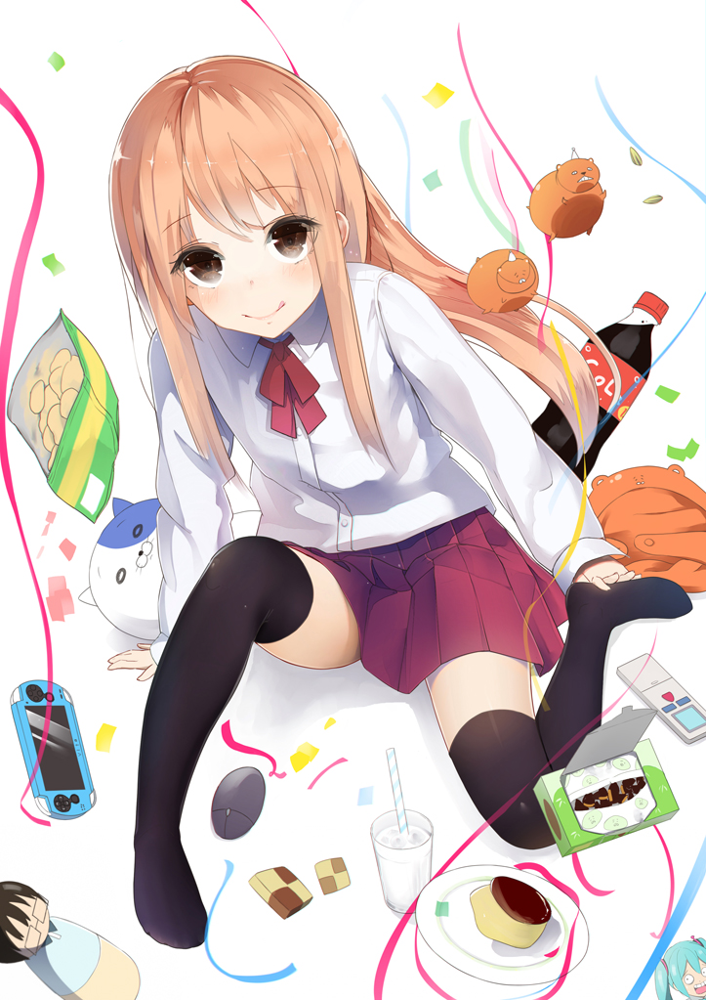

In [450]:
im = Image.open('/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data/Hcz4gGxW001_9_13/data/007961.jpg' )
pad_type = 'edge'
pad_size = int(max(im.size[0], im.size[1]) / 2)
np_im = np.array(im)
tmp_im = Image.fromarray(np.rot90(np.array([np.pad(np_im[:,:,0], pad_size, pad_type), \
                                  np.pad(np_im[:,:,1], pad_size, pad_type), \
                                  np.pad(np_im[:,:,2], pad_size, pad_type)]).T, 3))
tmp_im = ImageOps.mirror(tmp_im)
im

In [473]:
crop_img(annofile_list[3])

save_dir: /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data/nTeEcRpg001_9_4/crop
nTeEcRpg001_9_4/data/002275.jpg 1/118
nTeEcRpg001_9_4/data/002287.png 2/118
nTeEcRpg001_9_4/data/002309.jpg 3/118
nTeEcRpg001_9_4/data/002238.jpg 4/118
nTeEcRpg001_9_4/data/002319.jpg 5/118
nTeEcRpg001_9_4/data/002217.png 6/118
nTeEcRpg001_9_4/data/002223.jpg 7/118
exchange 1.24528301887 842 378 568.0 451.0
nTeEcRpg001_9_4/data/002229.png 8/118
nTeEcRpg001_9_4/data/002220.jpg 9/118
nTeEcRpg001_9_4/data/002322.png 10/118
nTeEcRpg001_9_4/data/002326.png 11/118
nTeEcRpg001_9_4/data/002224.jpg 12/118
nTeEcRpg001_9_4/data/002250.png 13/118
nTeEcRpg001_9_4/data/002262.jpg 14/118
nTeEcRpg001_9_4/data/002304.png 15/118
nTeEcRpg001_9_4/data/002325.jpg 16/118
nTeEcRpg001_9_4/data/002212.jpg 17/118
nTeEcRpg001_9_4/data/002286.jpg 18/118
nTeEcRpg001_9_4/data/002303.jpg 19/118
nTeEcRpg001_9_4/data/002324.png 20/118
nTeEcRpg001_9_4/data/002218.jpg 21/118
nTeEcRpg001_9_4/data/002226.jpg 22/118
nTeEcRpg001_9_4

In [113]:
import shutil
file_dir = '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2'
file_dir2 = '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop'
list_crop=[]

In [72]:
def copyfile(srcfile, dstpath):
    fpath,fname=os.path.split(srcfile)
    addname = os.path.split(os.path.split(fpath)[0])[1]
    dstfile = os.path.join(dstpath, addname +'_'+ fname)
    shutil.copyfile(srcfile,dstfile)      #复制文件
    print "copy %s -> %s"%( srcfile,dstfile)

In [114]:
def listdir(path, list_name):  #传入存储的list
    for file in os.listdir(path):  
        file_path = os.path.join(path, file)  
        if os.path.isdir(file_path):  
            listdir(file_path, list_name)  
        elif os.path.split(os.path.dirname(file_path))[1] == 'crop':  
            list_name.append(file_path)
listdir(file_dir, list_crop)
list_crop

['/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005163.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001391.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008315.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010626.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_3_005431.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006110.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009504.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007236.jpg',
 '/data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004830.jpg',
 '/data2/minjunli/prj/test_anime/img-

In [115]:
for index, srcfile in enumerate(list_crop):
    print str(index+1)+'/'+str(len(list_crop))
    copyfile(srcfile, file_dir2)

1/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005163.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005163.jpg
2/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001391.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001391.jpg
3/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008315.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008315.jpg
4/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010626.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010626.jpg
5/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_3_005431.jpg -> /data2/minjunli/p

494/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004067.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004067.jpg
495/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007741.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_007741.jpg
496/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007118.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_007118.jpg
497/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003853.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003853.jpg
498/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_2_003960.jpg -> /data2/

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007444.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_007444.jpg
988/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008809.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008809.jpg
989/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010564.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010564.jpg
990/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003885.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003885.jpg
991/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_011099.jpg -> /data2/minjunli/p

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004537.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004537.jpg
1517/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006821.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_006821.jpg
1518/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004477.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004477.jpg
1519/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_1_001657.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_1_001657.jpg
1520/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010669.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003544.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003544.jpg
2053/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007823.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_007823.jpg
2054/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002330.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002330.jpg
2055/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002093.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002093.jpg
2056/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007795.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010747.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010747.jpg
2588/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008905.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008905.jpg
2589/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005311.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005311.jpg
2590/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002179.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002179.jpg
2591/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002735.jpg -> /data2/minjun

3108/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004689.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004689.jpg
3109/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003567.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003567.jpg
3110/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008278.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008278.jpg
3111/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006930.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_006930.jpg
3112/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_011039.jpg -> /d

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006915.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_006915.jpg
3610/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001864.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001864.jpg
3611/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009571.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_009571.jpg
3612/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002190.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002190.jpg
3613/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010735.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003296.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003296.jpg
4130/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003243.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003243.jpg
4131/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010140.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010140.jpg
4132/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002812.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002812.jpg
4133/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008065.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_1_002941.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_1_002941.jpg
4664/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003442.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003442.jpg
4665/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_011075.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_011075.jpg
4666/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_1_005295.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_1_005295.jpg
4667/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010399.jpg -> /data2/minjun

5171/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009742.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_009742.jpg
5172/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004343.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004343.jpg
5173/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009945.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_009945.jpg
5174/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009708.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_009708.jpg
5175/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001784.jpg -> /d

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010533.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010533.jpg
5680/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009354.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_009354.jpg
5681/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001800.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001800.jpg
5682/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004939.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004939.jpg
5683/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003856.jpg -> /data2/minjun

6113/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008642.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008642.jpg
6114/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002581.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002581.jpg
6115/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005493.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005493.jpg
6116/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002834.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002834.jpg
6117/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006551.jpg -> /d

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005631.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005631.jpg
6582/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005775.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005775.jpg
6583/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002341.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002341.jpg
6584/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010617.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010617.jpg
6585/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001313.jpg -> /data2/minjun

7091/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006489.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_006489.jpg
7092/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004431.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004431.jpg
7093/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008201.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008201.jpg
7094/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005941.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005941.jpg
7095/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004172.jpg -> /d

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005533.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_005533.jpg
7589/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004438.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004438.jpg
7590/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_2_002582.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_2_002582.jpg
7591/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001987.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001987.jpg
7592/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_005368.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010264.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010264.jpg
8103/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_1_006180.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_1_006180.jpg
8104/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003661.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003661.jpg
8105/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_000628.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_000628.jpg
8106/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001205.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003678.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003678.jpg
8629/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001206.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001206.jpg
8630/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_000320.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_000320.jpg
8631/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002475.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002475.jpg
8632/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009834.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004139.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004139.jpg
9155/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001140.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001140.jpg
9156/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007861.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_007861.jpg
9157/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_006228.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_006228.jpg
9158/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001965.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_1_001981.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_1_001981.jpg
9680/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002280.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002280.jpg
9681/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004005.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004005.jpg
9682/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004090.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004090.jpg
9683/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010697.jpg -> /data2/minjun

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004270.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004270.jpg
10202/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007659.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_007659.jpg
10203/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008932.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_008932.jpg
10204/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002217.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002217.jpg
10205/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_008620.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_000710.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_000710.jpg
10722/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002042.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002042.jpg
10723/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010806.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010806.jpg
10724/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004054.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004054.jpg
10725/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004064.jpg -> /data2/mi

11241/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003345.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003345.jpg
11242/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_001406.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_001406.jpg
11243/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_010980.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_010980.jpg
11244/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_002593.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_002593.jpg
11245/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_007013.jpg 

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_003099.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_003099.jpg
11758/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009342.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_009342.jpg
11759/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_000673.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_000673.jpg
11760/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_004215.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/17TqLnza001_9_30_crop_0_004215.jpg
11761/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/17TqLnza001_9_30/crop/crop_0_009601.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001845.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001845.jpg
12246/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000400.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000400.jpg
12247/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_002129.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_002129.jpg
12248/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_2_000607.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_2_000607.jpg
12249/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_002172.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001926.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001926.jpg
12679/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000594.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000594.jpg
12680/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001419.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001419.jpg
12681/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000777.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000777.jpg
12682/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_002216.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001172.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001172.jpg
13152/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000813.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000813.jpg
13153/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001495.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001495.jpg
13154/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001181.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001181.jpg
13155/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001800.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000765.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000765.jpg
13630/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001101.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001101.jpg
13631/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001387.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001387.jpg
13632/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001975.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001975.jpg
13633/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001850.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000392.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000392.jpg
14089/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001810.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001810.jpg
14090/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_001017.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_001017.jpg
14091/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_000595.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/6K1ojs9N001_9_30_crop_0_000595.jpg
14092/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/6K1ojs9N001_9_30/crop/crop_0_002496.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017611.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017611.jpg
14547/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010626.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010626.jpg
14548/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011446.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_011446.jpg
14549/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009504.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_009504.jpg
14550/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010679.jpg -> /data2/mi

15057/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017744.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017744.jpg
15058/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_014252.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_014252.jpg
15059/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_017852.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_017852.jpg
15060/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015593.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015593.jpg
15061/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_016430.jpg 

15568/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017917.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017917.jpg
15569/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015546.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015546.jpg
15570/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014413.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014413.jpg
15571/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016136.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016136.jpg
15572/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012988.jpg 

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017216.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017216.jpg
16070/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016298.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016298.jpg
16071/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015197.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015197.jpg
16072/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014874.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014874.jpg
16073/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012725.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014272.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014272.jpg
16568/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015144.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015144.jpg
16569/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_014410.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_014410.jpg
16570/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011168.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_011168.jpg
16571/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012530.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_016561.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_016561.jpg
17054/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010648.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010648.jpg
17055/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014902.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014902.jpg
17056/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017426.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017426.jpg
17057/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_017119.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012645.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_012645.jpg
17560/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009116.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_009116.jpg
17561/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009664.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_009664.jpg
17562/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_008889.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_008889.jpg
17563/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010812.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017688.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017688.jpg
18059/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014707.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014707.jpg
18060/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014652.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014652.jpg
18061/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010867.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010867.jpg
18062/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009549.jpg -> /data2/mi

18547/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017230.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017230.jpg
18548/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_014828.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_014828.jpg
18549/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009142.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_009142.jpg
18550/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015591.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015591.jpg
18551/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_014641.jpg 

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012599.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_012599.jpg
19065/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010183.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010183.jpg
19066/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012016.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_012016.jpg
19067/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014812.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014812.jpg
19068/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009051.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016781.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016781.jpg
19566/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010698.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010698.jpg
19567/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_2_016985.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_2_016985.jpg
19568/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010148.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010148.jpg
19569/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_018305.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_009598.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_009598.jpg
20097/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016792.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016792.jpg
20098/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014988.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014988.jpg
20099/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_2_015955.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_2_015955.jpg
20100/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_013980.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_008792.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_008792.jpg
20575/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_016156.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_016156.jpg
20576/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016285.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016285.jpg
20577/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017929.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017929.jpg
20578/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_016025.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015392.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015392.jpg
21073/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011415.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_011415.jpg
21074/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009631.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_009631.jpg
21075/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012129.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_012129.jpg
21076/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009139.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016595.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016595.jpg
21563/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016442.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016442.jpg
21564/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017320.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017320.jpg
21565/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011756.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_011756.jpg
21566/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015141.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010104.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010104.jpg
22071/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010982.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010982.jpg
22072/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_013504.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_013504.jpg
22073/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011360.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_011360.jpg
22074/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016554.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_009195.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_009195.jpg
22551/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_016843.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_016843.jpg
22552/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_013185.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_013185.jpg
22553/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_018121.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_018121.jpg
22554/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017684.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014361.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014361.jpg
23030/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017092.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017092.jpg
23031/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010762.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010762.jpg
23032/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_018227.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_018227.jpg
23033/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_013413.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_015628.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_015628.jpg
23545/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015360.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015360.jpg
23546/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015400.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015400.jpg
23547/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014426.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_014426.jpg
23548/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011139.jpg -> /data2/mi

24059/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_3_017634.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_3_017634.jpg
24060/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_010095.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_010095.jpg
24061/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_017812.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_017812.jpg
24062/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_013240.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_013240.jpg
24063/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015274.jpg 

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_3_016515.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_3_016515.jpg
24559/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015065.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015065.jpg
24560/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012516.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_012516.jpg
24561/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_015156.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_015156.jpg
24562/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_018024.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_012515.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_012515.jpg
25041/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_1_017985.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_1_017985.jpg
25042/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_013172.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_013172.jpg
25043/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_011004.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/El9cqx0m001_9_30_crop_0_011004.jpg
25044/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/El9cqx0m001_9_30/crop/crop_0_014797.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000461.png -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000461.png
25411/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000176.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000176.jpg
25412/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000175.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000175.jpg
25413/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000520.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000520.jpg
25414/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000104.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000284.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000284.jpg
25697/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000096.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000096.jpg
25698/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000212.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000212.jpg
25699/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_0_000137.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/nTeEcRpg001_9_30_crop_0_000137.jpg
25700/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/nTeEcRpg001_9_30/crop/crop_1_000433.jpeg -> /data2/m

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000897.png -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000897.png
26085/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001158.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001158.jpg
26086/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001064.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001064.jpg
26087/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001791.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001791.jpg
26088/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001021.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001802.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001802.jpg
26634/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_1_002516.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_1_002516.jpg
26635/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000117.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000117.jpg
26636/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000220.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000220.jpg
26637/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000789.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000845.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000845.jpg
27205/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002322.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002322.jpg
27206/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000209.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000209.jpg
27207/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002860.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002860.jpg
27208/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000178.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001564.png -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001564.png
27751/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000614.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000614.jpg
27752/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000156.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000156.jpg
27753/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000771.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_000771.jpg
27754/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001949.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002990.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002990.jpg
28313/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002677.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002677.jpg
28314/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002746.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002746.jpg
28315/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_1_002515.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_1_002515.jpg
28316/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002195.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001072.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001072.jpg
28886/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002865.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002865.jpg
28887/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_001203.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_001203.jpg
28888/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_002666.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/VCaPNyMn001_9_30_crop_0_002666.jpg
28889/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/VCaPNyMn001_9_30/crop/crop_0_000165.png -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005924.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005924.jpg
29488/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_2_005284.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_2_005284.jpg
29489/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005243.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005243.jpg
29490/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_000221.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_000221.jpg
29491/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_4_005166.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005197.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005197.jpg
30162/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_001489.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_001489.jpg
30163/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004425.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_004425.jpg
30164/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_004449.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_004449.jpg
30165/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005985.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004736.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_004736.jpg
30836/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003097.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003097.jpg
30837/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_005254.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_005254.jpg
30838/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_2_003458.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_2_003458.jpg
30839/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_006480.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003569.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003569.jpg
31511/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_001135.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_001135.jpg
31512/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004754.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_004754.jpg
31513/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003953.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003953.jpg
31514/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_001612.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_004977.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_004977.jpg
32185/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004573.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_004573.jpg
32186/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003852.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003852.jpg
32187/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003452.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003452.jpg
32188/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005629.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004651.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_004651.jpg
32859/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_002452.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_002452.jpg
32860/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_004794.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_004794.jpg
32861/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_004029.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_004029.jpg
32862/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_006428.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_006010.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_006010.jpg
33533/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_2_003087.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_2_003087.jpg
33534/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_002242.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_002242.jpg
33535/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003403.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003403.jpg
33536/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003780.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_006356.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_006356.jpg
34210/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005446.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005446.jpg
34211/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003196.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003196.jpg
34212/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004233.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_004233.jpg
34213/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005940.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_007193.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_007193.jpg
34893/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_007371.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_007371.jpg
34894/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_000488.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_000488.jpg
34895/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_006348.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_006348.jpg
34896/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005932.jpg -> /data2/mi

35580/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005942.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005942.jpg
35581/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_000755.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_000755.jpg
35582/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005223.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005223.jpg
35583/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_002164.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_002164.jpg
35584/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_000080.jpg 

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_007775.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_1_007775.jpg
36270/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005577.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005577.jpg
36271/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_004637.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_004637.jpg
36272/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_002370.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_002370.jpg
36273/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_000205.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005919.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005919.jpg
36967/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_003896.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_003896.jpg
36968/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_007590.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_007590.jpg
36969/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_006725.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_006725.jpg
36970/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_005868.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_004576.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_004576.jpg
37666/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_005420.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_005420.jpg
37667/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_006343.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_006343.jpg
37668/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_0_000420.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/JyQ0iCaC001_9_30_crop_0_000420.jpg
37669/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/JyQ0iCaC001_9_30/crop/crop_1_004381.jpg -> /data2/mi

38244/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000002.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_000002.jpg
38245/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_002297.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_002297.jpg
38246/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001408.png -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001408.png
38247/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000588.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_000588.jpg
38248/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_3_000434.png 

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001526.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001526.jpg
38769/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000210.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_000210.jpg
38770/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_002473.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_002473.jpg
38771/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_002175.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_002175.jpg
38772/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001425.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001786.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001786.jpg
39289/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000559.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_000559.jpg
39290/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001891.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001891.jpg
39291/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001882.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001882.jpg
39292/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000902.png -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_1_000248.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_1_000248.jpg
39819/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001695.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001695.jpg
39820/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001331.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001331.jpg
39821/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001896.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001896.jpg
39822/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000913.jpg -> /data2/mi

copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001908.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001908.jpg
40353/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_001056.png -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_001056.png
40354/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_002039.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_002039.jpg
40355/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_002255.jpg -> /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/crop/Hcz4gGxW001_9_30_crop_0_002255.jpg
40356/40466
copy /data2/minjunli/prj/test_anime/img-trans-pytorch/scripts/data2/Hcz4gGxW001_9_30/crop/crop_0_000650.jpg -> /data2/mi

In [119]:
list_test = []
for files in os.listdir(file_dir2):
    list_test.append(files)
print(len(list_test))     

56300


In [120]:
import csv
import xlwt
workbook = xlwt.Workbook(encoding = 'utf-8')
xlsheet = workbook.add_sheet("excel写入练习",cell_overwrite_ok=True)
for i in range(len(list_test)):
    xlsheet.write(i,0,list_test[i])
workbook.save('test.xls')
    